<a href="https://colab.research.google.com/github/arunm917/Table_HCR/blob/main/Table_detection_and_extraction_V4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## importing packages and image

In [1]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

In [2]:
import gdown
# Google Drive file ID
file_id = "1GXlWLsLNfyLCB53zIxSv9lV1088Uc5ak"

# Output file name
input_file = "accutech_template"

# Download the file
url = f"https://drive.google.com/uc?id={file_id}"
gdown.download(url, input_file, quiet=False)

print(f"File downloaded as {input_file}")

Downloading...
From: https://drive.google.com/uc?id=1GXlWLsLNfyLCB53zIxSv9lV1088Uc5ak
To: /content/accutech_template
100%|██████████| 2.46M/2.46M [00:00<00:00, 123MB/s]

File downloaded as accutech_template


## Preprocessing image to identify contours

In [3]:
image = cv2.imread(input_file)

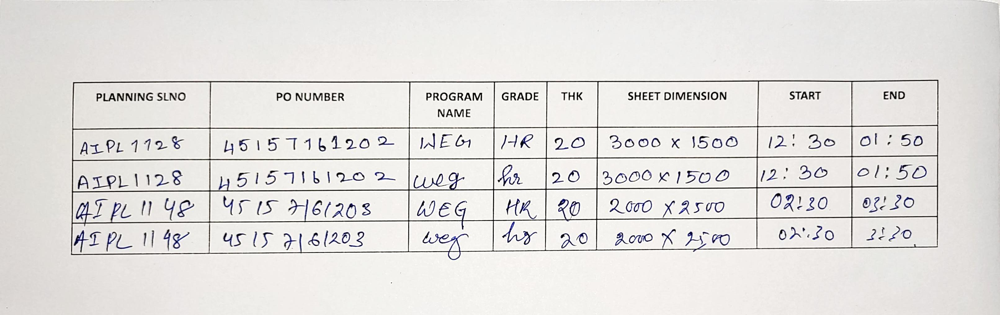

In [4]:
cv2_imshow(image)

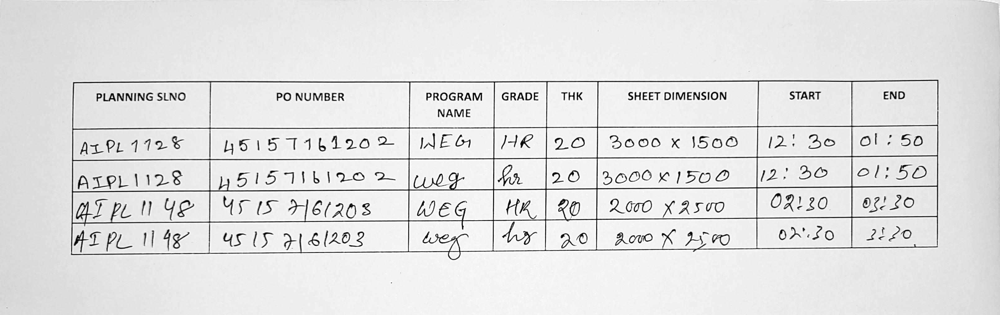

In [5]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

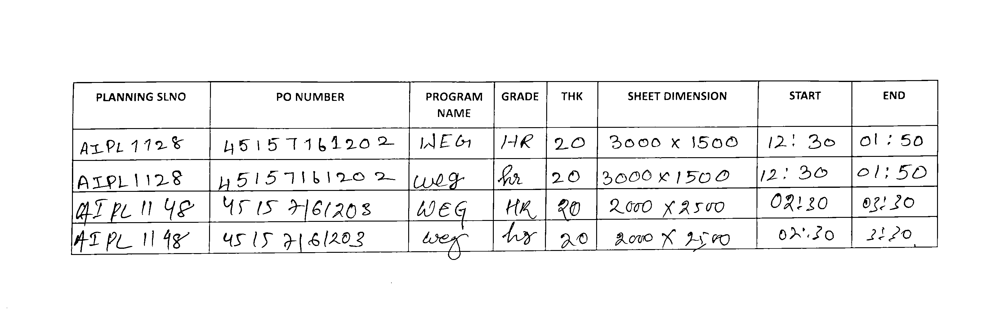

In [6]:
thresholded_image = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
cv2_imshow(thresholded_image)

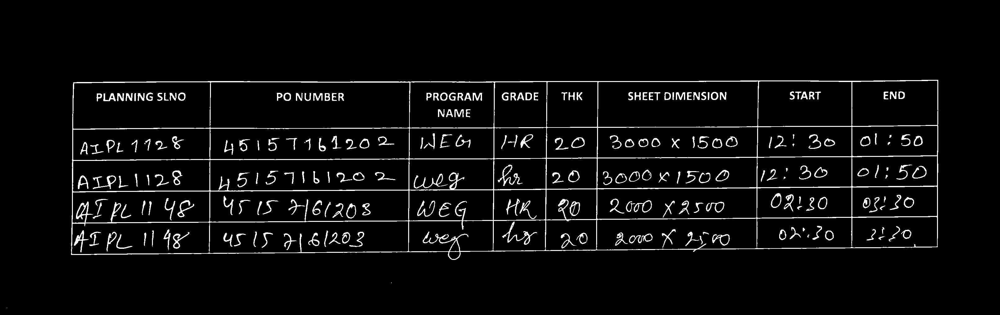

In [7]:
inverted_image = cv2.bitwise_not(thresholded_image)
cv2_imshow(inverted_image)

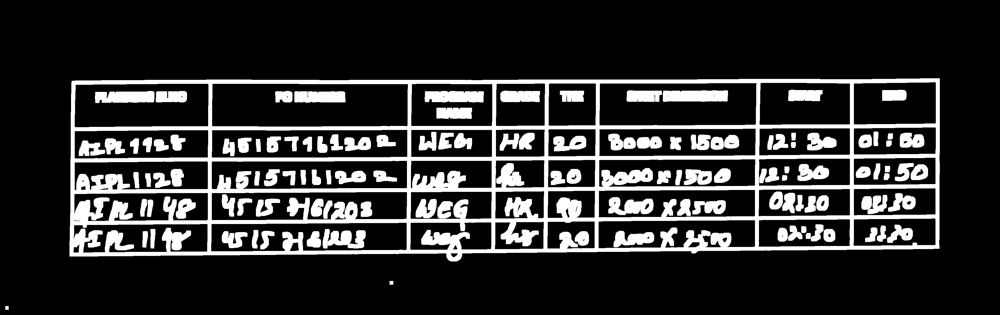

In [8]:
dilated_image = cv2.dilate(inverted_image, None, iterations = 5)
cv2_imshow(dilated_image)

In [9]:
# find contours
contours, hierarchy = cv2.findContours(dilated_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# Below lines are added to show all contours
# This is not needed, but it is useful for debugging
image_with_all_contours = image.copy()
cv2.drawContours(image_with_all_contours, contours, -1, (0, 255, 0), 3)

array([[[220, 223, 227],
        [222, 225, 229],
        [221, 224, 228],
        ...,
        [232, 235, 239],
        [227, 230, 234],
        [222, 225, 229]],

       [[220, 223, 227],
        [221, 224, 228],
        [220, 223, 227],
        ...,
        [231, 234, 238],
        [225, 228, 232],
        [219, 222, 226]],

       [[221, 224, 228],
        [221, 224, 228],
        [219, 222, 226],
        ...,
        [230, 233, 237],
        [227, 230, 234],
        [225, 228, 232]],

       ...,

       [[209, 212, 216],
        [209, 212, 216],
        [210, 213, 217],
        ...,
        [208, 211, 215],
        [208, 211, 215],
        [208, 211, 215]],

       [[214, 217, 221],
        [214, 217, 221],
        [214, 217, 221],
        ...,
        [208, 211, 215],
        [208, 211, 215],
        [208, 211, 215]],

       [[214, 217, 221],
        [214, 217, 221],
        [214, 217, 221],
        ...,
        [208, 211, 215],
        [208, 211, 215],
        [208, 211, 215]]

In [10]:
# Filter contours and leave only rectangles
rectangular_contours = []
for contour in contours:
  peri = cv2.arcLength(contour, True)
  approx = cv2.approxPolyDP(contour, 0.02 * peri, True)
  if len(approx) == 4:
    rectangular_contours.append(approx)
      # Below lines are added to show all rectangular contours
      # This is not needed, but it is useful for debugging
    image_with_only_rectangular_contours = image.copy()
    cv2.drawContours(image_with_only_rectangular_contours, rectangular_contours, -1, (0, 255, 0), 3)

In [11]:
# find largest contour by area
max_area = 0
contour_with_max_area = None
for contour in rectangular_contours:
    area = cv2.contourArea(contour)
    if area > max_area:
        max_area = area
        contour_with_max_area = contour
# Below lines are added to show the contour with max area
# This is not needed, but it is useful for debugging
image_with_contour_with_max_area = image.copy()
cv2.drawContours(image_with_contour_with_max_area, [contour_with_max_area], -1, (0, 255, 0), 3)

array([[[220, 223, 227],
        [222, 225, 229],
        [221, 224, 228],
        ...,
        [232, 235, 239],
        [227, 230, 234],
        [222, 225, 229]],

       [[220, 223, 227],
        [221, 224, 228],
        [220, 223, 227],
        ...,
        [231, 234, 238],
        [225, 228, 232],
        [219, 222, 226]],

       [[221, 224, 228],
        [221, 224, 228],
        [219, 222, 226],
        ...,
        [230, 233, 237],
        [227, 230, 234],
        [225, 228, 232]],

       ...,

       [[209, 212, 216],
        [209, 212, 216],
        [210, 213, 217],
        ...,
        [208, 211, 215],
        [208, 211, 215],
        [208, 211, 215]],

       [[214, 217, 221],
        [214, 217, 221],
        [214, 217, 221],
        ...,
        [208, 211, 215],
        [208, 211, 215],
        [208, 211, 215]],

       [[214, 217, 221],
        [214, 217, 221],
        [214, 217, 221],
        ...,
        [208, 211, 215],
        [208, 211, 215],
        [208, 211, 215]]

## Perspective correction

In [12]:
def order_points(pts):
        # initialzie a list of coordinates that will be ordered
        # such that the first entry in the list is the top-left,
        # the second entry is the top-right, the third is the
        # bottom-right, and the fourth is the bottom-left
        pts = pts.reshape(4, 2)
        rect = np.zeros((4, 2), dtype="float32")

        # the top-left point will have the smallest sum, whereas
        # the bottom-right point will have the largest sum
        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]
        rect[2] = pts[np.argmax(s)]

        # now, compute the difference between the points, the
        # top-right point will have the smallest difference,
        # whereas the bottom-left will have the largest difference
        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]
        rect[3] = pts[np.argmax(diff)]

        # return the ordered coordinates
        return rect
def calculateDistanceBetween2Points(p1, p2):
        dis = ((p2[0] - p1[0]) ** 2 + (p2[1] - p1[1]) ** 2) ** 0.5
        return dis

In [13]:
# Order points in the contour with max area
contour_with_max_area_ordered = order_points(contour_with_max_area)
image_with_points_plotted = image.copy()
for point in contour_with_max_area_ordered:
    point_coordinates = (int(point[0]), int(point[1]))
    image_with_points_plotted = cv2.circle(image_with_points_plotted, point_coordinates, 10, (0, 0, 255), -1)

In [14]:
# calculate new width and height of image
existing_image_width = image.shape[1]
existing_image_width_reduced_by_10_percent = int(existing_image_width * 0.9)

distance_between_top_left_and_top_right = calculateDistanceBetween2Points(contour_with_max_area_ordered[0], contour_with_max_area_ordered[1])
distance_between_top_left_and_bottom_left = calculateDistanceBetween2Points(contour_with_max_area_ordered[0], contour_with_max_area_ordered[3])

aspect_ratio = distance_between_top_left_and_bottom_left / distance_between_top_left_and_top_right

new_image_width = existing_image_width_reduced_by_10_percent
new_image_height = int(new_image_width * aspect_ratio)

In [15]:
# apply perspective transform

pts1 = np.float32(contour_with_max_area_ordered)
pts2 = np.float32([[0, 0], [new_image_width, 0], [new_image_width, new_image_height], [0, new_image_height]])
matrix = cv2.getPerspectiveTransform(pts1, pts2)
perspective_corrected_image = cv2.warpPerspective(image, matrix, (new_image_width, new_image_height))

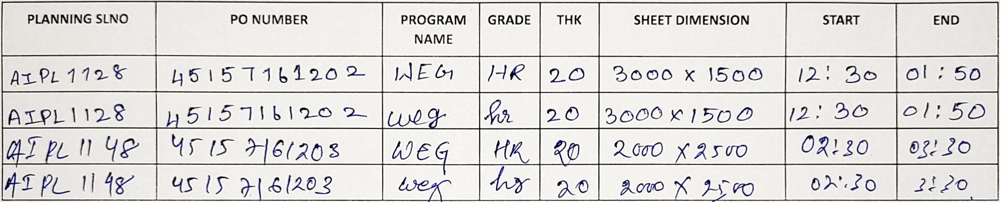

In [16]:
cv2_imshow(perspective_corrected_image)

## Padding

In [17]:
# add_10_percent_padding
image_height = image.shape[0]
padding = int(image_height * 0.1)
perspective_corrected_image_with_padding = cv2.copyMakeBorder(perspective_corrected_image, padding, padding, padding, padding, cv2.BORDER_CONSTANT, value=[255, 255, 255])

In [18]:
# draw_contours
image_with_contours = image.copy()
image_with_contours_padded = cv2.drawContours(image_with_contours,  [contour_with_max_area ], -1, (0, 255, 0), 1)

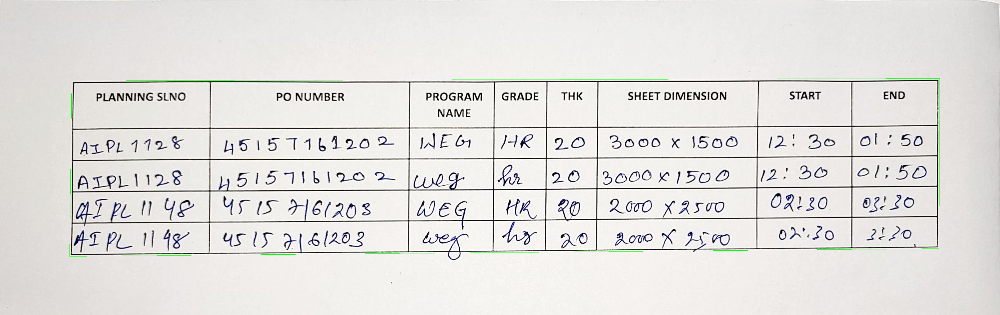

In [19]:
cv2_imshow(image_with_contours_padded)

## Removing lines

### Method 1
this could also be done by the code from stach overflow present in other notebook with table transformer

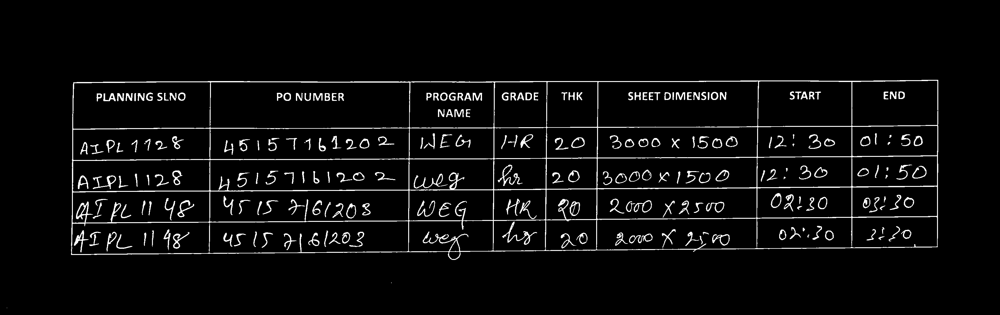

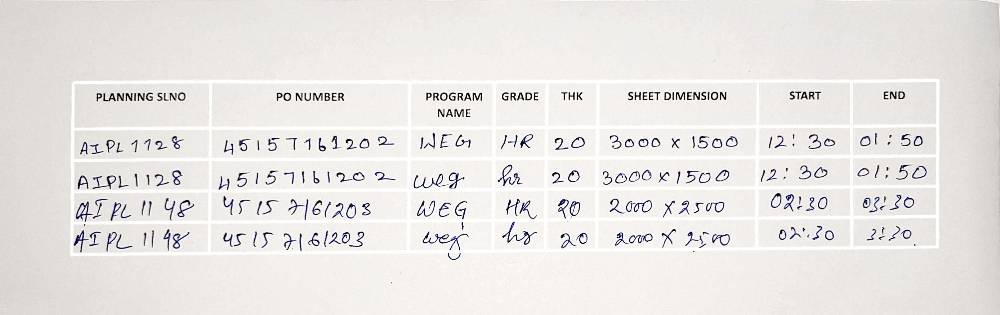

-1

In [20]:
result = image.copy()
gray = cv2.cvtColor(image_with_contours_padded,cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Remove horizontal lines
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40,1))
remove_horizontal = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)
cnts = cv2.findContours(remove_horizontal, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    cv2.drawContours(result, [c], -1, (255,255,255), 5)

# Remove vertical lines
vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,40))
remove_vertical = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, vertical_kernel, iterations=2)
cnts = cv2.findContours(remove_vertical, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    cv2.drawContours(result, [c], -1, (255,255,255), 5)

cv2_imshow(thresh)
cv2_imshow(result)
cv2.imwrite('result.tif', result)
cv2.waitKey()

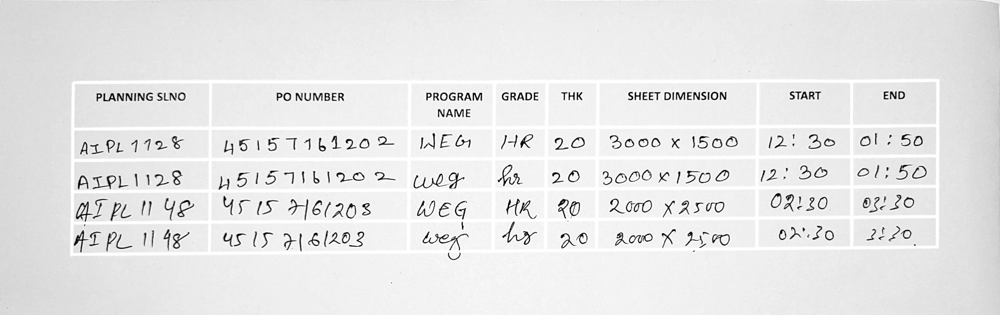

In [21]:
grayscale_image = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
cv2_imshow(grayscale_image)

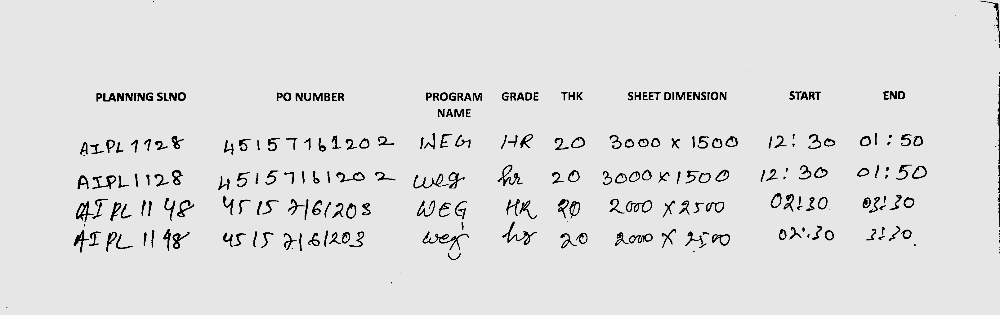

In [22]:
# Binarization with manual thresholding
thresh, binary_image = cv2.threshold(grayscale_image, 200, 230, cv2.THRESH_BINARY)
cv2_imshow(binary_image)

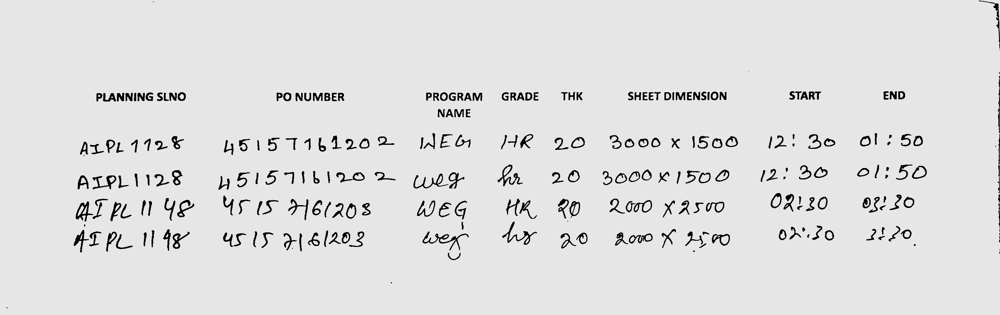

In [23]:
# noise removal
def noise_removal(image):
  kernel = np.ones((1, 1), np.uint8)
  image = cv2.dilate(image, kernel, iterations=1)
  kernel = np.ones((1, 1), np.uint8)
  image = cv2.erode(image, kernel, iterations=1)
  image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
  image = cv2.medianBlur(image, 3)
  return (image)

no_noise = noise_removal(binary_image)
cv2_imshow(no_noise)

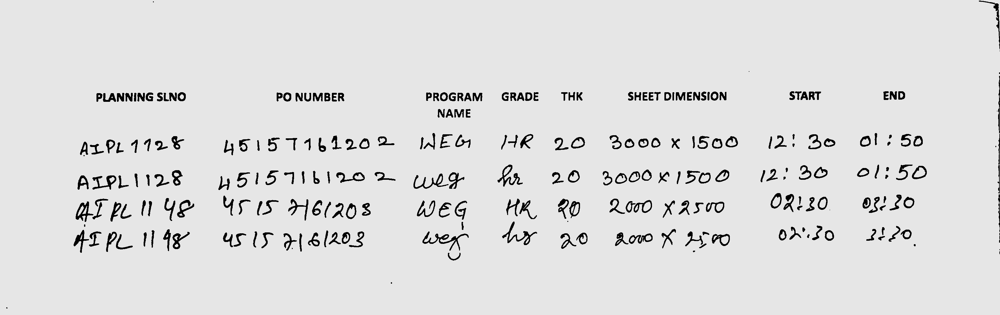

In [24]:
eroded_image = cv2.erode(no_noise, (7,7), iterations = 1)
cv2_imshow(eroded_image)

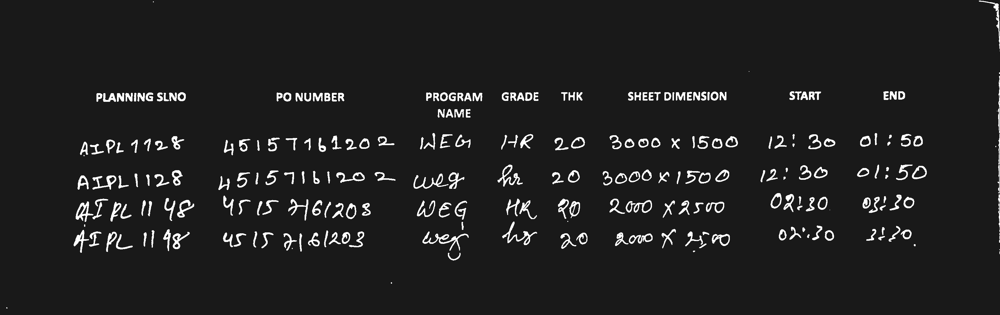

In [25]:
padded_inverted_image_M1 = cv2.bitwise_not(eroded_image)
cv2_imshow(padded_inverted_image_M1)

### Method 2

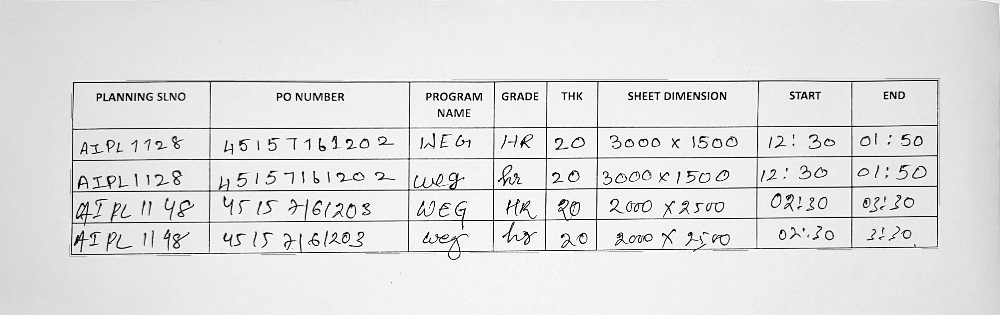

In [32]:
# continuing with the padded image
padded_gray_image = cv2.cvtColor(image_with_contours_padded, cv2.COLOR_BGR2GRAY)
cv2_imshow(padded_gray_image)

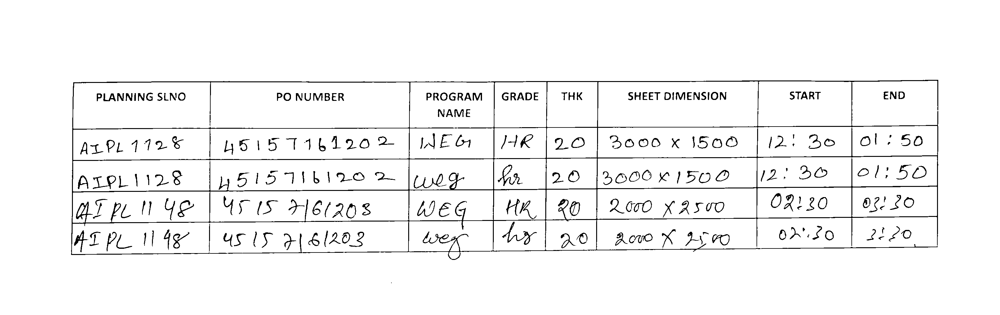

In [33]:
padded_gray_thresholded = cv2.threshold(padded_gray_image, 120, 255, cv2.THRESH_BINARY)[1]
cv2_imshow(padded_gray_thresholded)

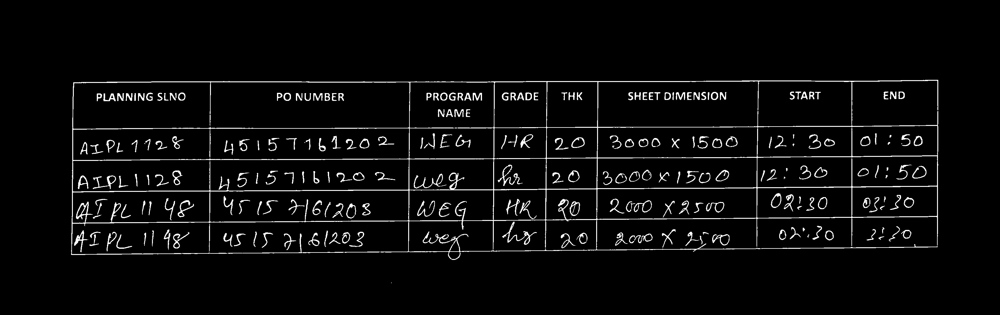

In [34]:
padded_inverted_image = cv2.bitwise_not(padded_gray_thresholded)
cv2_imshow(padded_inverted_image)

In [35]:
# eroding vertical lines
hor = np.array([[1,1,1,1,1,1]])
vertical_lines_eroded_image = cv2.erode(padded_inverted_image, hor, iterations=10)
vertical_lines_eroded_image = cv2.dilate(vertical_lines_eroded_image, hor, iterations=10)

In [36]:
# eroding horizontal lines
ver = np.array([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]])
horizontal_lines_eroded_image = cv2.erode(padded_inverted_image, ver, iterations=10)
horizontal_lines_eroded_image = cv2.dilate(horizontal_lines_eroded_image, ver, iterations=10)

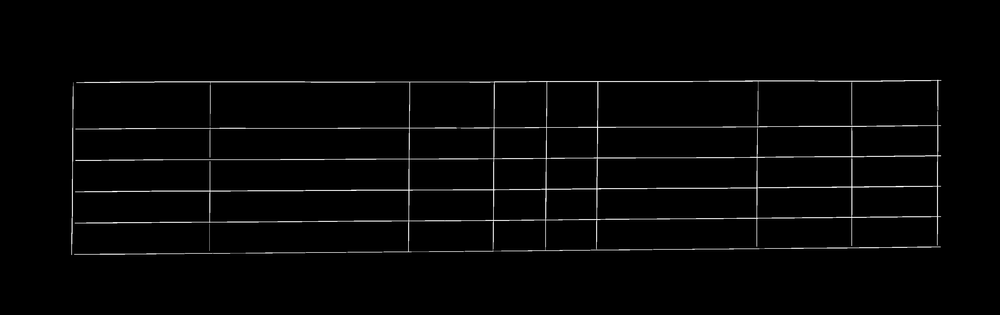

In [37]:
# combined eroded image
combined_image = cv2.add(vertical_lines_eroded_image, horizontal_lines_eroded_image)
cv2_imshow(combined_image)

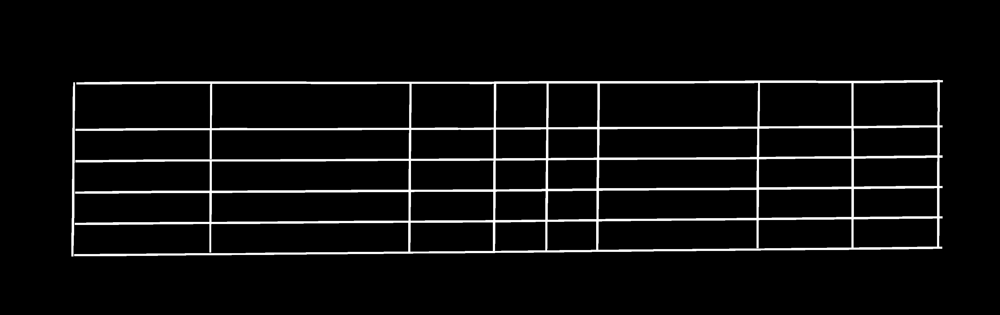

In [38]:
#dilate_combined_image_to_make_lines_thicker(self):
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
combined_image_dilated = cv2.dilate(combined_image, kernel, iterations=5)
cv2_imshow(combined_image_dilated)

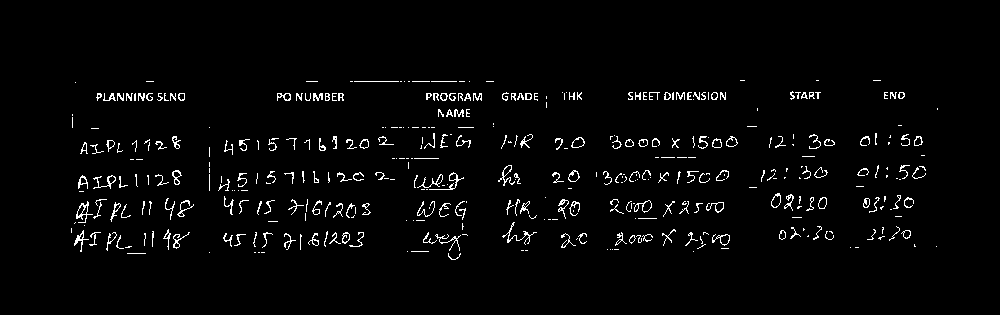

In [39]:
#subtract_combined_and_dilated_image_from_original_image(self):
image_without_lines = cv2.subtract(inverted_image, combined_image_dilated)
cv2_imshow(image_without_lines)

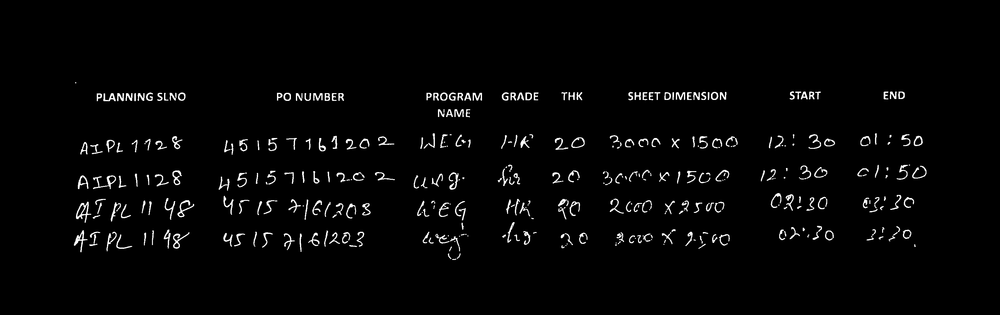

In [40]:
# remove_noise_with_erode_and_dilate(self):
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
image_without_lines_noise_removed = cv2.erode(image_without_lines, kernel, iterations=1)
image_without_lines_noise_removed = cv2.dilate(image_without_lines_noise_removed, kernel, iterations=1)
cv2_imshow(image_without_lines_noise_removed)

## Cropping cells and appling OCR

In [ ]:
%%capture
!sudo apt-get update
!sudo apt-get install tesseract-ocr
!pip install pytesseract
!pip install easyocr

In [53]:
import pytesseract
from PIL import Image
import os
import easyocr

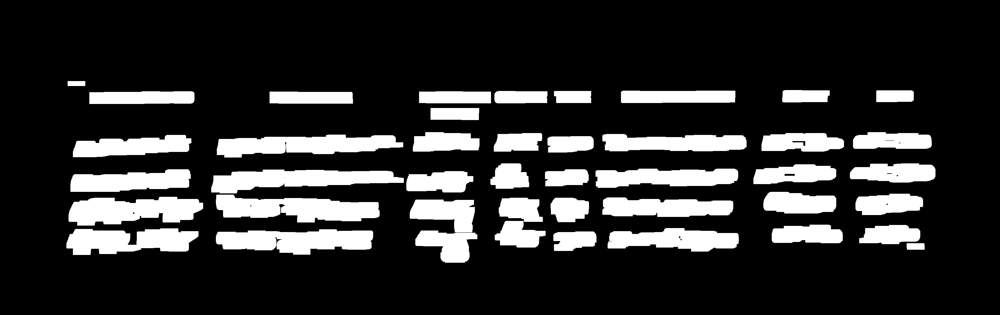

In [41]:
# dilate image
kernel_to_remove_gaps_between_words = np.array([
                [1,1,1,1,1,1,1,1,1,1],
               [1,1,1,1,1,1,1,1,1,1]
        ])
dilated_image = cv2.dilate(image_without_lines_noise_removed, kernel_to_remove_gaps_between_words, iterations=5)
simple_kernel = np.ones((5,5), np.uint8)
dilated_image = cv2.dilate(dilated_image, simple_kernel, iterations=2)
cv2_imshow(dilated_image)

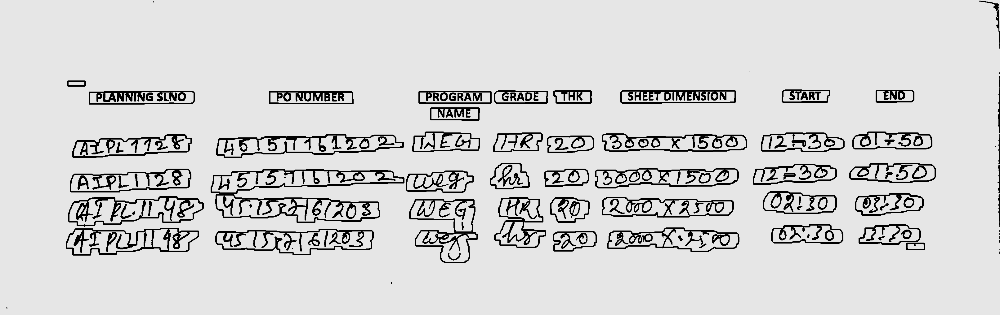

In [43]:
# finding contours

result = cv2.findContours(dilated_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = result[0]
image_with_contours_drawn = eroded_image.copy()
cv2.drawContours(image_with_contours_drawn, contours, -1, (0, 255, 0), 3)
cv2_imshow(image_with_contours_drawn)

In [46]:
# convert_contours_to_bounding_boxes
bounding_boxes = []
image_with_all_bounding_boxes = eroded_image.copy()
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    bounding_boxes.append((x, y, w, h))
    # This line below is about
    # drawing a rectangle on the image with the shape of
    # the bounding box. Its not needed for the OCR.
    # Its just added for debugging purposes.
    image_with_all_bounding_boxes = cv2.rectangle(image_with_all_bounding_boxes, (x, y), (x + w, y + h), (0, 255, 0), 5)

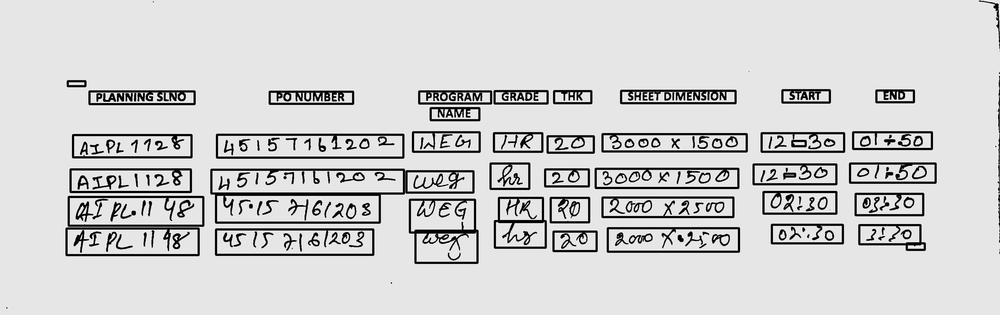

In [47]:
cv2_imshow(image_with_all_bounding_boxes)

In [48]:
# get_mean_height_of_bounding_boxes
heights = []
for bounding_box in bounding_boxes:
    x, y, w, h = bounding_box
    heights.append(h)
mean_height = np.mean(heights)
# sort_bounding_boxes_by_y_coordinate
bounding_boxes = sorted(bounding_boxes, key=lambda x: x[1])

# club_all_bounding_boxes_by_similar_y_coordinates_into_rows(self):
rows = []
half_of_mean_height = mean_height / 2
current_row = [bounding_boxes[0] ]
for bounding_box in bounding_boxes[1:]:
    current_bounding_box_y = bounding_box[1]
    previous_bounding_box_y = current_row[-1][1]
    distance_between_bounding_boxes = abs(current_bounding_box_y - previous_bounding_box_y)
    if distance_between_bounding_boxes <= half_of_mean_height:
        current_row.append(bounding_box)
    else:
        rows.append(current_row)
        current_row = [ bounding_box ]
rows.append(current_row)

# sort_all_rows_by_x_coordinate
for row in rows:
    row.sort(key=lambda x: x[0])

In [54]:
# def get_result_from_tersseract(image_path):
#     # Load the image using PIL
#     img = Image.open(image_path)

#     # Define the custom options for Tesseract
#     # custom_config = r'--oem 3 --psm 7 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789().calmg*"'

#     # Run Tesseract on the image
#     output = pytesseract.image_to_string(img, lang='eng')
#     print(output)
#     return output.strip()

#Using easyOCR instead of Pytesseract

def get_result_from_easyocr(image_path):
    # Initialize the EasyOCR reader for English language
    reader = easyocr.Reader(['en'])

    # Load the image using PIL
    img = Image.open(image_path)

    # Convert the PIL image to a format that EasyOCR can process
    img = img.convert('RGB')  # Ensure the image is in RGB mode

    # Run EasyOCR on the image
    result = reader.readtext(np.array(img), detail=0)

    # Join the detected text parts and print the result
    output = ' '.join(result)
    print(output)
    return output.strip()

# crop_each_bounding_box_and_ocr:
table = []
current_row = []
image_number = 0

# Create a folder named 'output_folder'
output_folder = "output_folder"
os.makedirs(output_folder, exist_ok=True)
output_folder = '/content/output_folder'

for row in rows:
    for bounding_box in row:
        x, y, w, h = bounding_box
        y = y - 5
        cropped_image = eroded_image[y:y+h, x:x+w]

        # Save the cropped image in the specified folder
        image_slice_path = os.path.join(output_folder, "img_" + str(image_number) + ".jpg")
        cv2.imwrite(image_slice_path, cropped_image)
        results_from_ocr = get_result_from_easyocr(image_slice_path) # change function name according to ocr library
        current_row.append(results_from_ocr)
        image_number += 1
    table.append(current_row)
    current_row = []

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

/usr/local/lib/python3.10/dist-packages/easyocr/detection.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  net.load_state_dict(copyStateDict(torch.load(trained_model, ma

PLANNING SLNO


Po Number


PROGRAM


GRADE


ThK


SHEET DIMENSION


START


END


NAME


AIPL 112 &


4515 716 120 2


WNE61


I-r


20


3000 X IsO


12 : 30


oi ; 50


AIPL | 128


0515718 /20 2


Ug


Sn


3000 X 150


12 , 30


0|:50


QI PL |1 42


45 Is 96(30 8


Weg


RR


R0


QOGO X?stO


08120


0242o


AI pL Il4x


45 U #|6/202


beK


hx


a0


Aao K Xm


04',Zo


24 20



Downloading a folder

In [51]:
import shutil
from google.colab import files

# Specify the folder to be zipped and downloaded
folder_to_zip = 'output_folder'
output_filename = 'output_folder.zip'

# Zip the folder
shutil.make_archive(output_filename.replace('.zip', ''), 'zip', folder_to_zip)

# Download the zipped folder
files.download(output_filename)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>